In [24]:
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 150
import datetime as dt
import numpy as np
from numpy.fft import fft, ifft
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [25]:
milk = pd.read_csv("AllMilkingsDaily_Weather.csv")
milk["Timestamp"] = pd.to_datetime(milk["Timestamp"])
milk = milk.set_index("Timestamp")

In [26]:
def corrPrint(slice, wVar, t):
    pCorr = slice["DailyYield"].corr(slice[wVar], method = "pearson")
    kCorr = slice["DailyYield"].corr(slice[wVar], method = "kendall")
    sCorr = slice["DailyYield"].corr(slice[wVar], method = "spearman")
    print(f"The correlations between average daily yield and {wVar} for the {t} are:")
    print(f"Pearson: {round(pCorr, 3)} \t\t Kendall: {round(kCorr, 3)} \t\t Spearman: {round(sCorr, 3)}\n")

In [27]:
def summerAverageSplitCorrs(farmSlice, wVar, o, fname):
    cownames = farmSlice["SE_Number"].unique()
    l = len(cownames)
    avProd = pd.DataFrame()
    for name in cownames:
        cow = farmSlice[farmSlice["SE_Number"] == name]
        avg = cow["DailyYield"].mean()
        avProd = pd.concat([avProd, pd.DataFrame.from_records([{"SE_Number": name, "AvgYield": avg}])])
    avProd = avProd.sort_values("AvgYield")

    bottomHalfNames = avProd.head(int(l/2))["SE_Number"]
    topHalfNames = avProd.tail(int(l/2))["SE_Number"]
    bottomTenthNames = avProd.head(int(l/10))["SE_Number"]
    topTenthNames = avProd.tail(int(l/10))["SE_Number"]
    bottomPercentNames = avProd.head(int(l/100))["SE_Number"]
    topPercentNames = avProd.tail(int(l/100))["SE_Number"]

    bottomHalf = farmSlice[farmSlice["SE_Number"].isin(bottomHalfNames)]
    topHalf = farmSlice[farmSlice["SE_Number"].isin(topHalfNames)]
    bottomTenth = farmSlice[farmSlice["SE_Number"].isin(bottomTenthNames)]
    topTenth = farmSlice[farmSlice["SE_Number"].isin(topTenthNames)]
    bottomPercent = farmSlice[farmSlice["SE_Number"].isin(bottomPercentNames)]
    topPercent = farmSlice[farmSlice["SE_Number"].isin(topPercentNames)]

    avgBottomHalf = bottomHalf.groupby([bottomHalf.index.date]).agg({'DailyYield': 'mean'})
    avgTopHalf = topHalf.groupby([topHalf.index.date]).agg({'DailyYield': 'mean'})
    avgBottomTenth = bottomTenth.groupby([bottomTenth.index.date]).agg({'DailyYield': 'mean'})
    avgTopTenth = topTenth.groupby([topTenth.index.date]).agg({'DailyYield': 'mean'})
    avgBottomPercent = bottomPercent.groupby([bottomPercent.index.date]).agg({'DailyYield': 'mean'})
    avgTopPercent = topPercent.groupby([topPercent.index.date]).agg({'DailyYield': 'mean'})

    dailyWeather = farmSlice.drop(labels=["DailyYield", "DailyCount", "FarmName_Pseudo", "SE_Number"], axis=1).drop_duplicates()

    avgBottomPercent = pd.merge(avgBottomPercent, dailyWeather, left_index=True, right_index=True)
    avgBottomTenth = pd.merge(avgBottomTenth, dailyWeather, left_index=True, right_index=True)
    avgBottomHalf = pd.merge(avgBottomHalf, dailyWeather, left_index=True, right_index=True)
    avgTopHalf = pd.merge(avgTopHalf, dailyWeather, left_index=True, right_index=True)
    avgTopTenth = pd.merge(avgTopTenth, dailyWeather, left_index=True, right_index=True)
    avgTopPercent = pd.merge(avgTopPercent, dailyWeather, left_index=True, right_index=True)

    avgSummerBottomPercent = avgBottomPercent[avgBottomPercent.index.month.isin([6,7,8])]
    avgWinterBottomPercent = avgBottomPercent[avgBottomPercent.index.month.isin([1,2,3,4,5,9,10,11,12])]

    avgSummerBottomTenth = avgBottomTenth [avgBottomTenth .index.month.isin([6,7,8])]
    avgWinterBottomTenth  = avgBottomTenth [avgBottomTenth .index.month.isin([1,2,3,4,5,9,10,11,12])]

    avgSummerBottomHalf = avgBottomHalf[avgBottomHalf.index.month.isin([6,7,8])]
    avgWinterBottomHalf = avgBottomHalf[avgBottomHalf.index.month.isin([1,2,3,4,5,9,10,11,12])]

    avgSummerTopHalf = avgTopHalf[avgTopHalf.index.month.isin([6,7,8])]
    avgWinterTopHalf = avgTopHalf[avgTopHalf.index.month.isin([1,2,3,4,5,9,10,11,12])]

    avgSummerTopTenth = avgTopTenth[avgTopTenth.index.month.isin([6,7,8])]
    avgWinterTopTenth = avgTopTenth[avgTopTenth.index.month.isin([1,2,3,4,5,9,10,11,12])]

    avgSummerTopPercent = avgTopPercent[avgTopPercent.index.month.isin([6,7,8])]
    avgWinterTopPercent = avgTopPercent[avgTopPercent.index.month.isin([1,2,3,4,5,9,10,11,12])]

    corrPrint(avgWinterBottomPercent, wVar, "bottom percent of producers")
    corrPrint(avgSummerBottomPercent, wVar, "bottom percent of producers in summer")

    corrPrint(avgWinterBottomTenth, wVar, "bottom tenth of producers")
    corrPrint(avgSummerBottomTenth, wVar, "bottom tenth of producers in summer")

    corrPrint(avgWinterBottomHalf, wVar, "bottom half of producers")
    corrPrint(avgSummerBottomHalf, wVar, "bottom half of producers in summer")

    corrPrint(avgWinterTopHalf, wVar, "top half of producers")
    corrPrint(avgSummerTopHalf, wVar, "top half of producers in summer")

    corrPrint(avgWinterTopTenth, wVar, "top tenth of producers")
    corrPrint(avgSummerTopTenth, wVar, "top tenth of producers in summer")

    corrPrint(avgWinterTopPercent, wVar, "top percent of producers")
    corrPrint(avgSummerTopPercent, wVar, "top percent of producers in summer")

    sns.set()
    fig, axs = plt.subplots(3, 2, figsize = (11,14))
    fig.tight_layout(h_pad  = 3)
    axs = axs.ravel()
    sns.regplot(x = avgWinterBottomPercent[wVar], y = avgWinterBottomPercent["DailyYield"], ax=axs[0], line_kws={"color": "limegreen"}, order = o).set(title='Bottom percent')
    sns.regplot(x = avgSummerBottomPercent[wVar], y = avgSummerBottomPercent["DailyYield"], ax=axs[0], line_kws={"color": "crimson"}, order = o)

    sns.regplot(x = avgWinterBottomTenth[wVar], y = avgWinterBottomTenth["DailyYield"], ax=axs[1], line_kws={"color": "limegreen"}, order = o).set(title='Bottom tenth')
    sns.regplot(x = avgSummerBottomTenth[wVar], y = avgSummerBottomTenth["DailyYield"], ax=axs[1], line_kws={"color": "crimson"}, order = o)

    sns.regplot(x = avgWinterBottomHalf[wVar], y = avgWinterBottomHalf["DailyYield"], ax=axs[2], line_kws={"color": "limegreen"}, order = o).set(title='Bottom half')
    sns.regplot(x = avgSummerBottomHalf[wVar], y = avgSummerBottomHalf["DailyYield"], ax=axs[2], line_kws={"color": "crimson"}, order = o)

    sns.regplot(x = avgWinterTopHalf[wVar], y = avgWinterTopHalf["DailyYield"], ax=axs[3], line_kws={"color": "limegreen"}, order = o).set(title='Top half')
    sns.regplot(x = avgSummerTopHalf[wVar], y = avgSummerTopHalf["DailyYield"], ax=axs[3], line_kws={"color": "crimson"}, order = o)

    sns.regplot(x = avgWinterTopTenth[wVar], y = avgWinterTopTenth["DailyYield"], ax=axs[4], line_kws={"color": "limegreen"}, order = o).set(title='Top tenth')
    sns.regplot(x = avgSummerTopTenth[wVar], y = avgSummerTopTenth["DailyYield"], ax=axs[4], line_kws={"color": "crimson"}, order = o)

    sns.regplot(x = avgWinterTopPercent[wVar], y = avgWinterTopPercent["DailyYield"], ax=axs[5], line_kws={"color": "limegreen"}, order = o).set(title='Top percent')
    sns.regplot(x = avgSummerTopPercent[wVar], y = avgSummerTopPercent["DailyYield"], ax=axs[5], line_kws={"color": "crimson"}, order = o)

    fig.suptitle(f'Average daily milk production for {fname}', fontsize=16)
    plt.subplots_adjust(top=0.92)

    plt.show()


 a624fb9a 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: 0.22 		 Kendall: 0.052 		 Spearman: 0.094

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: nan 		 Kendall: nan 		 Spearman: nan

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.023 		 Kendall: 0.012 		 Spearman: 0.019

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: -0.098 		 Kendall: -0.06 		 Spearman: -0.087

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.284 		 Kendall: -0.161 		 Spearman: -0.236

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.204 		 Kendall: -0.12 		 Spearman: -0.175

The correlations between average daily yield and THI_me

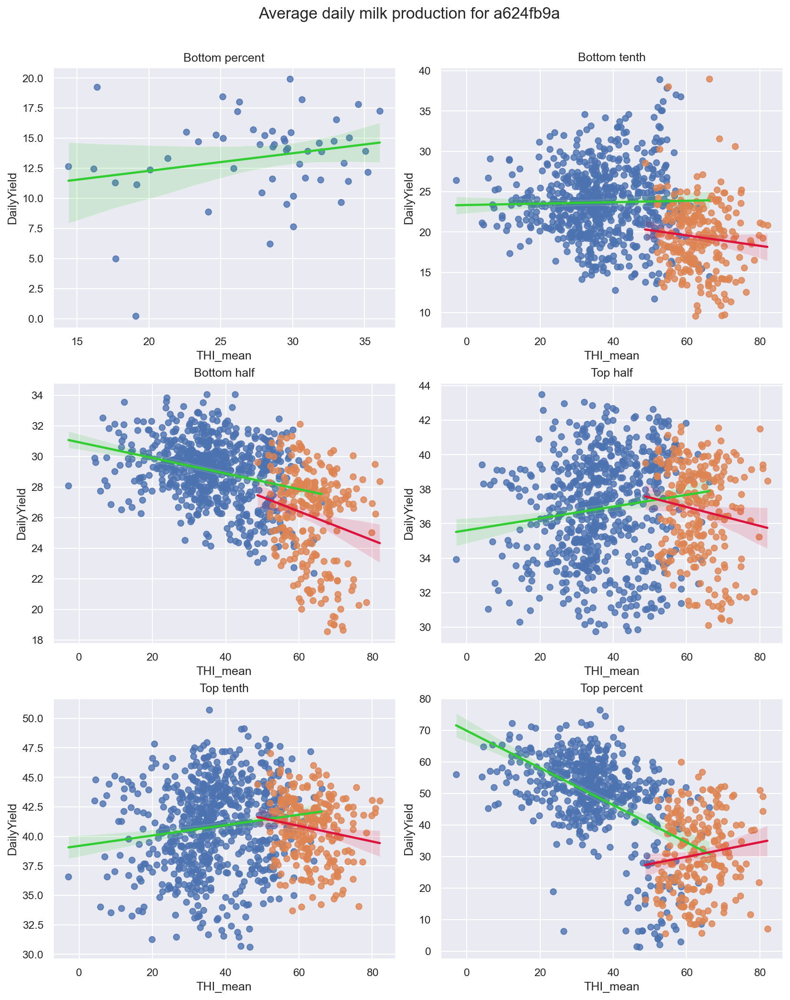


 f454e660 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: -0.185 		 Kendall: -0.157 		 Spearman: -0.186

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: nan 		 Kendall: nan 		 Spearman: nan

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.125 		 Kendall: 0.131 		 Spearman: 0.205

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: -0.042 		 Kendall: 0.018 		 Spearman: 0.023

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.051 		 Kendall: -0.034 		 Spearman: -0.072

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.16 		 Kendall: -0.096 		 Spearman: -0.143

The correlations between average daily yield and THI

C:\Users\rober\AppData\Roaming\Python\Python311\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\rober\AppData\Roaming\Python\Python311\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)


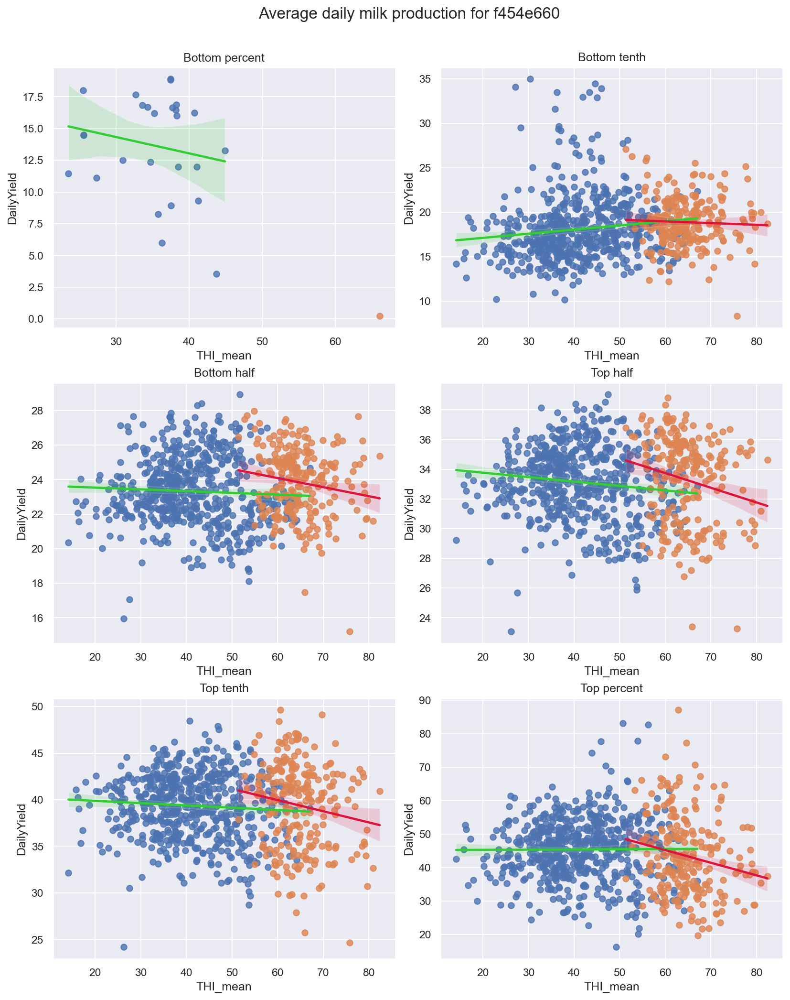


 540275a1 



C:\Users\rober\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4881: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: nan 		 Kendall: nan 		 Spearman: nan

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: -0.251 		 Kendall: -0.051 		 Spearman: -0.093

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.316 		 Kendall: 0.193 		 Spearman: 0.287

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: -0.049 		 Kendall: -0.016 		 Spearman: -0.026

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.19 		 Kendall: -0.099 		 Spearman: -0.148

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.011 		 Kendall: -0.011 		 Spearman: -0.019

The correlations between average daily yield and THI_mean for t

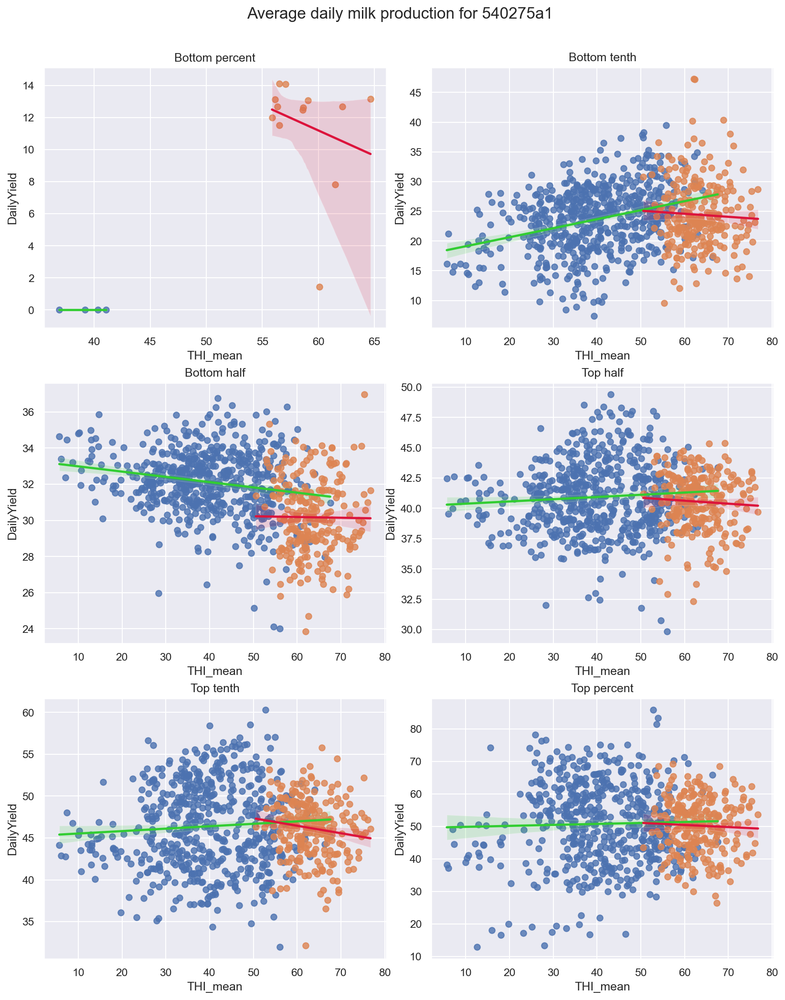


 ab18b151 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: -0.529 		 Kendall: -0.39 		 Spearman: -0.557

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: -0.38 		 Kendall: -0.152 		 Spearman: -0.308

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: -0.006 		 Kendall: -0.02 		 Spearman: -0.03

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: 0.104 		 Kendall: 0.09 		 Spearman: 0.14

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.125 		 Kendall: -0.077 		 Spearman: -0.112

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: 0.012 		 Kendall: 0.009 		 Spearman: 0.013

The correlations between average daily yield and 

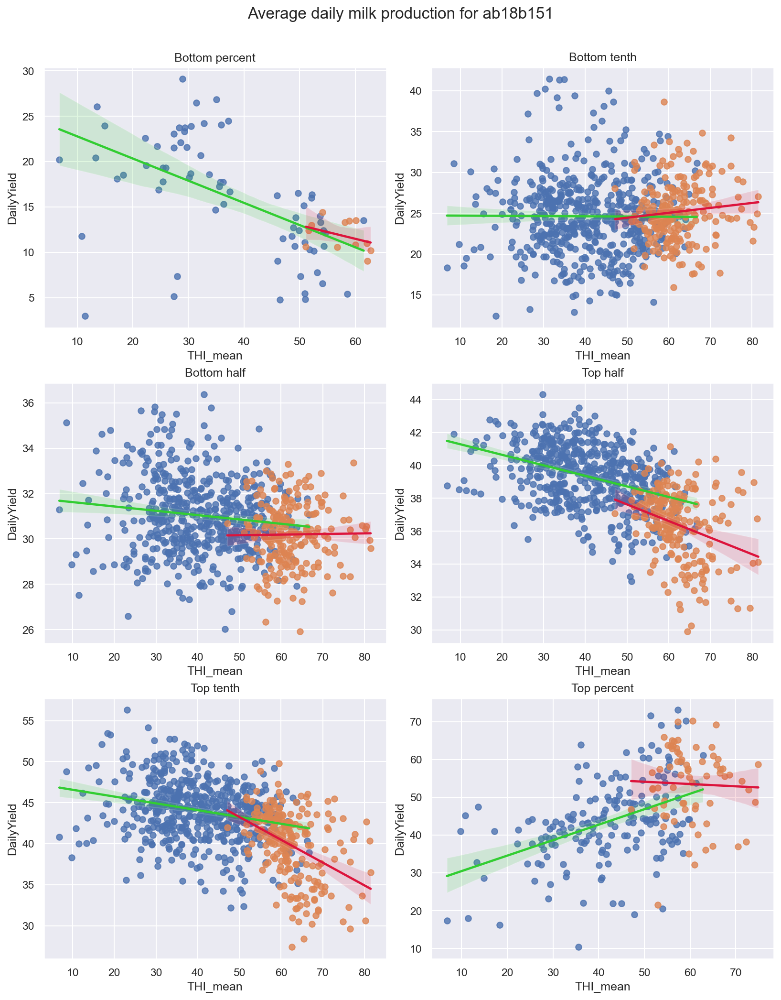


 752efd72 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: -0.126 		 Kendall: -0.023 		 Spearman: -0.038

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: 0.021 		 Kendall: -0.039 		 Spearman: -0.05

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.214 		 Kendall: 0.154 		 Spearman: 0.237

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: -0.139 		 Kendall: -0.066 		 Spearman: -0.093

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: 0.124 		 Kendall: 0.054 		 Spearman: 0.082

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.326 		 Kendall: -0.203 		 Spearman: -0.299

The correlations between average daily yield 

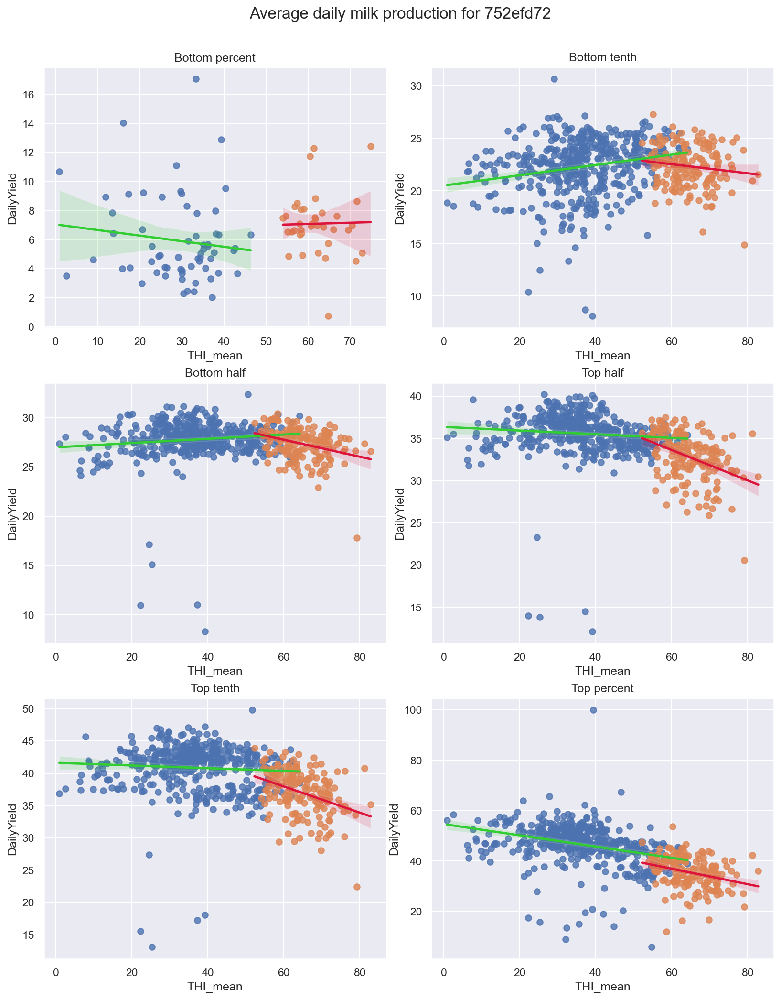


 5c06d92d 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: -0.006 		 Kendall: -0.011 		 Spearman: -0.023

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: -0.348 		 Kendall: -0.217 		 Spearman: -0.304

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.247 		 Kendall: 0.172 		 Spearman: 0.247

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: 0.254 		 Kendall: 0.25 		 Spearman: 0.345

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: 0.303 		 Kendall: 0.259 		 Spearman: 0.374

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.236 		 Kendall: -0.149 		 Spearman: -0.223

The correlations between average daily yield an

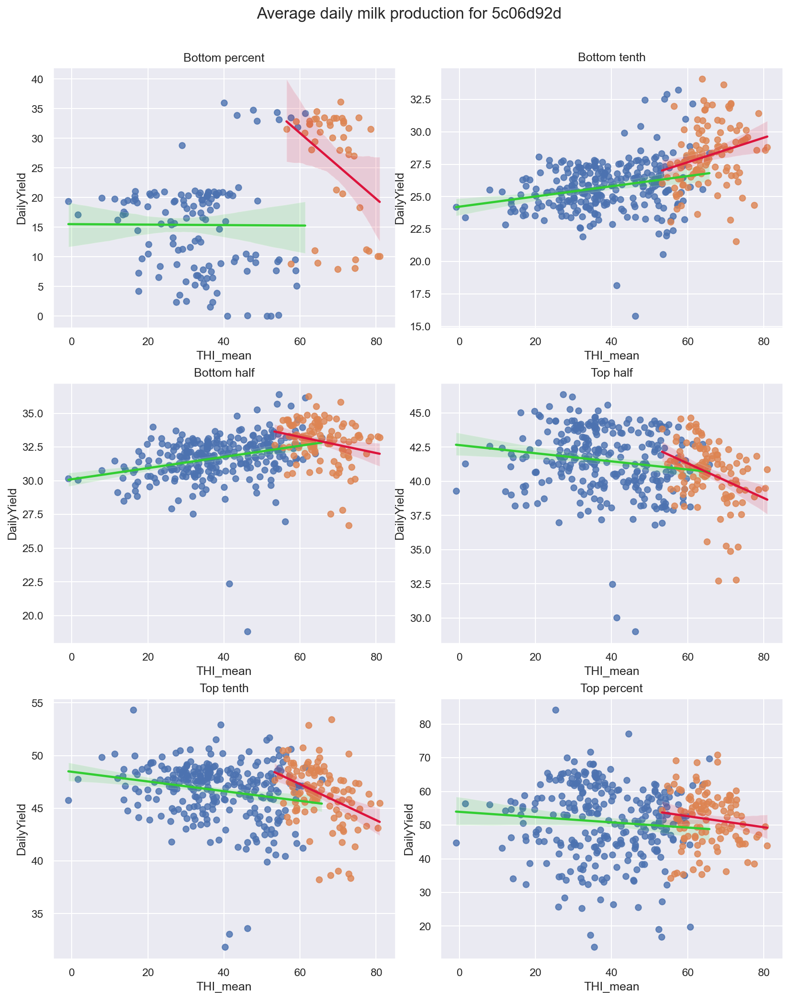


 ad0a39f5 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: nan 		 Kendall: nan 		 Spearman: nan

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: -0.287 		 Kendall: 0.0 		 Spearman: -0.091

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: -0.304 		 Kendall: -0.227 		 Spearman: -0.352

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: 0.134 		 Kendall: 0.105 		 Spearman: 0.158

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.496 		 Kendall: -0.368 		 Spearman: -0.552

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: 0.046 		 Kendall: 0.058 		 Spearman: 0.084

The correlations between average daily yield and THI_me

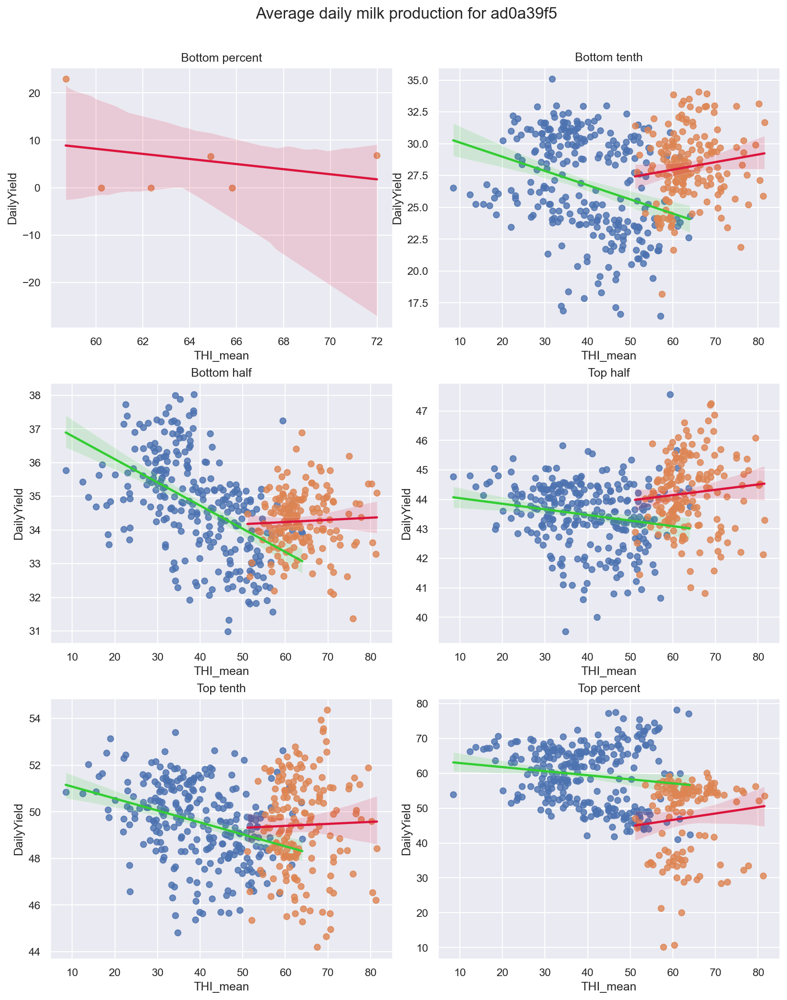

In [28]:
farms = ["a624fb9a","f454e660", "540275a1", "ab18b151", "752efd72", "5c06d92d", "ad0a39f5"]
for name in farms:
    farm = milk[milk["FarmName_Pseudo"] == name]
    print(f"\n {name} \n")
    summerAverageSplitCorrs(farm, "THI_mean", 1, name)

In [32]:
def summerSplitCorrs(farmSlice, wVar, o, fname):
    cownames = farmSlice["SE_Number"].unique()
    l = len(cownames)
    avProd = pd.DataFrame()
    for name in cownames:
        cow = farmSlice[farmSlice["SE_Number"] == name]
        avg = cow["DailyYield"].mean()
        avProd = pd.concat([avProd, pd.DataFrame.from_records([{"SE_Number": name, "AvgYield": avg}])])
    avProd = avProd.sort_values("AvgYield")

    bottomHalfNames = avProd.head(int(l/2))["SE_Number"]
    topHalfNames = avProd.tail(int(l/2))["SE_Number"]
    bottomTenthNames = avProd.head(int(l/10))["SE_Number"]
    topTenthNames = avProd.tail(int(l/10))["SE_Number"]
    bottomPercentNames = avProd.head(int(l/100))["SE_Number"]
    topPercentNames = avProd.tail(int(l/100))["SE_Number"]

    bottomHalf = farmSlice[farmSlice["SE_Number"].isin(bottomHalfNames)]
    topHalf = farmSlice[farmSlice["SE_Number"].isin(topHalfNames)]
    bottomTenth = farmSlice[farmSlice["SE_Number"].isin(bottomTenthNames)]
    topTenth = farmSlice[farmSlice["SE_Number"].isin(topTenthNames)]
    bottomPercent = farmSlice[farmSlice["SE_Number"].isin(bottomPercentNames)]
    topPercent = farmSlice[farmSlice["SE_Number"].isin(topPercentNames)]

    summerBottomPercent = bottomPercent[bottomPercent.index.month.isin([6,7,8])]
    winterBottomPercent = bottomPercent[bottomPercent.index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerBottomTenth = bottomTenth [bottomTenth .index.month.isin([6,7,8])]
    winterBottomTenth  = bottomTenth [bottomTenth .index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerBottomHalf = bottomHalf[bottomHalf.index.month.isin([6,7,8])]
    winterBottomHalf = bottomHalf[bottomHalf.index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerTopHalf = topHalf[topHalf.index.month.isin([6,7,8])]
    winterTopHalf = topHalf[topHalf.index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerTopTenth = topTenth[topTenth.index.month.isin([6,7,8])]
    winterTopTenth = topTenth[topTenth.index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerTopPercent = topPercent[topPercent.index.month.isin([6,7,8])]
    winterTopPercent = topPercent[topPercent.index.month.isin([1,2,3,4,5,9,10,11,12])]

    corrPrint(winterBottomPercent, wVar, "bottom percent of producers")
    corrPrint(summerBottomPercent, wVar, "bottom percent of producers in summer")

    corrPrint(winterBottomTenth, wVar, "bottom tenth of producers")
    corrPrint(summerBottomTenth, wVar, "bottom tenth of producers in summer")

    corrPrint(winterBottomHalf, wVar, "bottom half of producers")
    corrPrint(summerBottomHalf, wVar, "bottom half of producers in summer")

    corrPrint(winterTopHalf, wVar, "top half of producers")
    corrPrint(summerTopHalf, wVar, "top half of producers in summer")

    corrPrint(winterTopTenth, wVar, "top tenth of producers")
    corrPrint(summerTopTenth, wVar, "top tenth of producers in summer")

    corrPrint(winterTopPercent, wVar, "top percent of producers")
    corrPrint(summerTopPercent, wVar, "top percent of producers in summer")

    sns.set()
    fig, axs = plt.subplots(3, 2, figsize = (11,14))
    fig.tight_layout(h_pad  = 3)
    axs = axs.ravel()
    sns.regplot(x = winterBottomPercent[wVar], y = winterBottomPercent["DailyYield"], ax=axs[0], line_kws={"color": "limegreen"}, order = o).set(title='Bottom percent')
    sns.regplot(x = summerBottomPercent[wVar], y = summerBottomPercent["DailyYield"], ax=axs[0], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterBottomPercent[wVar], y = winterBottomPercent["DailyYield"], ax=axs[0])
    sns.kdeplot(x = summerBottomPercent[wVar], y = summerBottomPercent["DailyYield"], ax=axs[0])

    sns.regplot(x = winterBottomTenth[wVar], y = winterBottomTenth["DailyYield"], ax=axs[1], line_kws={"color": "limegreen"}, order = o).set(title='Bottom tenth')
    sns.regplot(x = summerBottomTenth[wVar], y = summerBottomTenth["DailyYield"], ax=axs[1], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterBottomTenth[wVar], y = winterBottomTenth["DailyYield"], ax=axs[1])
    sns.kdeplot(x = summerBottomTenth[wVar], y = summerBottomTenth["DailyYield"], ax=axs[1])

    sns.regplot(x = winterBottomHalf[wVar], y = winterBottomHalf["DailyYield"], ax=axs[2], line_kws={"color": "limegreen"}, order = o).set(title='Bottom half')
    sns.regplot(x = summerBottomHalf[wVar], y = summerBottomHalf["DailyYield"], ax=axs[2], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterBottomHalf[wVar], y = winterBottomHalf["DailyYield"], ax=axs[2])
    sns.kdeplot(x = summerBottomHalf[wVar], y = summerBottomHalf["DailyYield"], ax=axs[2])

    sns.regplot(x = winterTopHalf[wVar], y = winterTopHalf["DailyYield"], ax=axs[3], line_kws={"color": "limegreen"}, order = o).set(title='Top half')
    sns.regplot(x = summerTopHalf[wVar], y = summerTopHalf["DailyYield"], ax=axs[3], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterTopHalf[wVar], y = winterTopHalf["DailyYield"], ax=axs[3])
    sns.kdeplot(x = summerTopHalf[wVar], y = summerTopHalf["DailyYield"], ax=axs[3])

    sns.regplot(x = winterTopTenth[wVar], y = winterTopTenth["DailyYield"], ax=axs[4], line_kws={"color": "limegreen"}, order = o).set(title='Top tenth')
    sns.regplot(x = summerTopTenth[wVar], y = summerTopTenth["DailyYield"], ax=axs[4], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterTopTenth[wVar], y = winterTopTenth["DailyYield"], ax=axs[4])
    sns.kdeplot(x = summerTopTenth[wVar], y = summerTopTenth["DailyYield"], ax=axs[4])

    sns.regplot(x = winterTopPercent[wVar], y = winterTopPercent["DailyYield"], ax=axs[5], line_kws={"color": "limegreen"}, order = o).set(title='Top percent')
    sns.regplot(x = summerTopPercent[wVar], y = summerTopPercent["DailyYield"], ax=axs[5], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterTopPercent[wVar], y = winterTopPercent["DailyYield"], ax=axs[5])
    sns.kdeplot(x = summerTopPercent[wVar], y = summerTopPercent["DailyYield"], ax=axs[5])

    fig.suptitle(f'Daily milk production for every cow in {fname}', fontsize=16)
    plt.subplots_adjust(top=0.92)

    plt.show()


 a624fb9a 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: 0.22 		 Kendall: 0.052 		 Spearman: 0.094

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: nan 		 Kendall: nan 		 Spearman: nan

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.007 		 Kendall: -0.006 		 Spearman: -0.01

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: -0.023 		 Kendall: -0.041 		 Spearman: -0.061

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.058 		 Kendall: -0.043 		 Spearman: -0.064

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.069 		 Kendall: -0.056 		 Spearman: -0.083

The correlations between average daily yield and THI

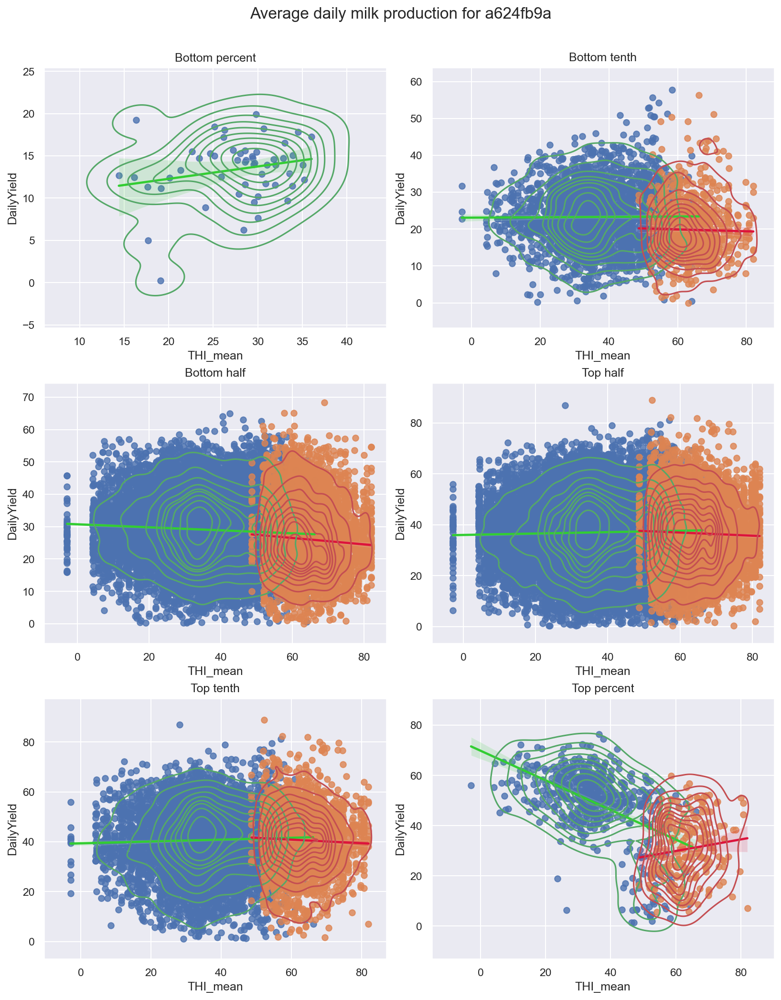


 f454e660 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: -0.185 		 Kendall: -0.157 		 Spearman: -0.186

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: nan 		 Kendall: nan 		 Spearman: nan

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.081 		 Kendall: 0.058 		 Spearman: 0.088

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: 0.013 		 Kendall: 0.0 		 Spearman: 0.001

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.017 		 Kendall: -0.012 		 Spearman: -0.018

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.033 		 Kendall: -0.026 		 Spearman: -0.039

The correlations between average daily yield and THI_m

C:\Users\rober\AppData\Roaming\Python\Python311\site-packages\numpy\lib\function_base.py:2845: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\rober\AppData\Roaming\Python\Python311\site-packages\numpy\lib\function_base.py:2704: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
C:\Users\rober\AppData\Local\Temp\ipykernel_6372\3841945598.py:68: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = summerBottomPercent[wVar], y = summerBottomPercent["DailyYield"], ax=axs[0])


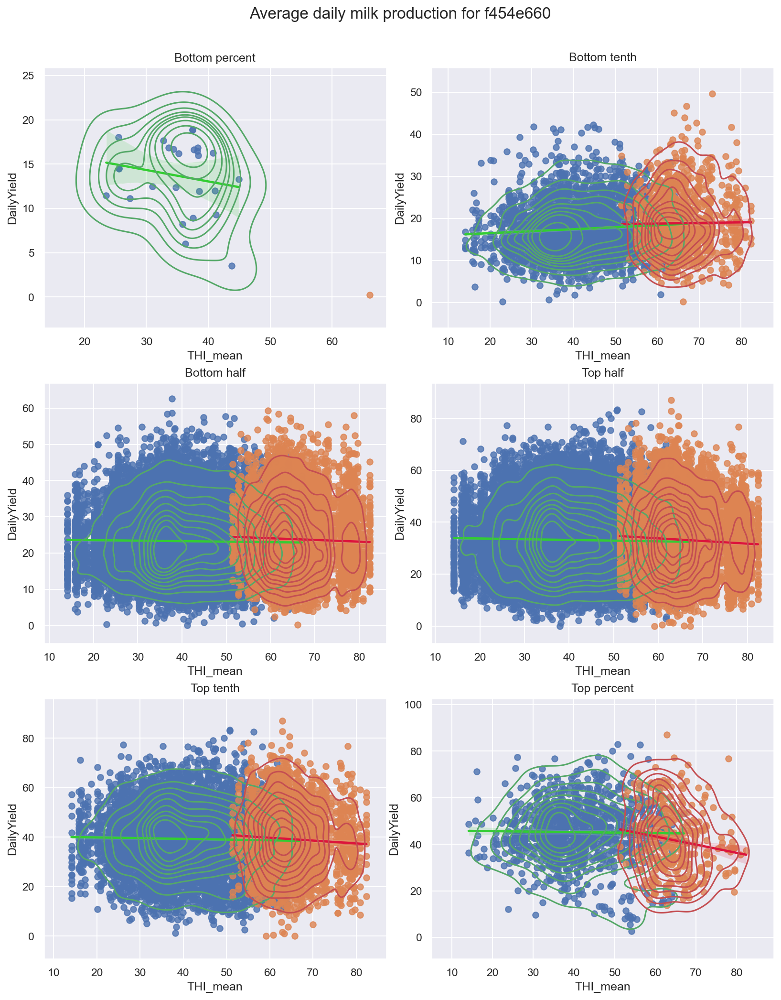


 540275a1 



C:\Users\rober\AppData\Roaming\Python\Python311\site-packages\scipy\stats\_stats_py.py:4881: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: nan 		 Kendall: nan 		 Spearman: nan

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: -0.251 		 Kendall: -0.051 		 Spearman: -0.093

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.128 		 Kendall: 0.066 		 Spearman: 0.098

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: -0.006 		 Kendall: -0.008 		 Spearman: -0.012

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.037 		 Kendall: -0.023 		 Spearman: -0.034

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.001 		 Kendall: 0.001 		 Spearman: 0.001

The correlations between average daily yield and THI_mean for th

C:\Users\rober\AppData\Local\Temp\ipykernel_6372\3841945598.py:67: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x = winterBottomPercent[wVar], y = winterBottomPercent["DailyYield"], ax=axs[0])


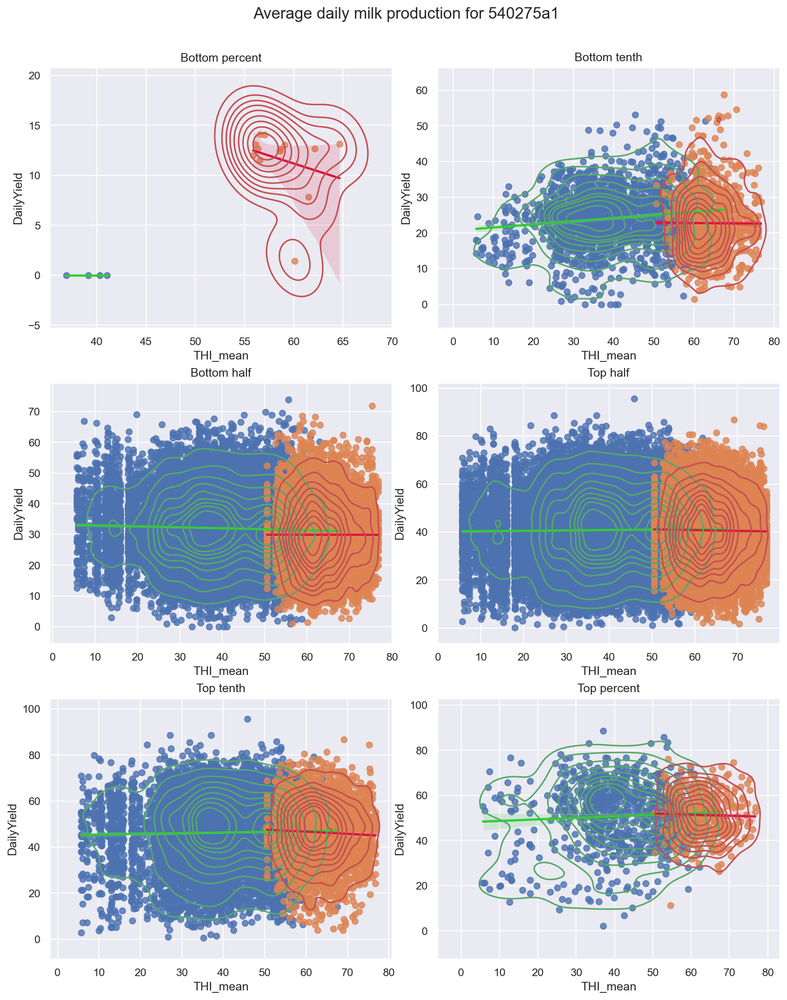


 ab18b151 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: -0.529 		 Kendall: -0.39 		 Spearman: -0.557

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: -0.38 		 Kendall: -0.152 		 Spearman: -0.308

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.048 		 Kendall: 0.014 		 Spearman: 0.021

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: 0.017 		 Kendall: 0.02 		 Spearman: 0.031

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.02 		 Kendall: -0.016 		 Spearman: -0.024

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: 0.003 		 Kendall: -0.001 		 Spearman: -0.002

The correlations between average daily yield and

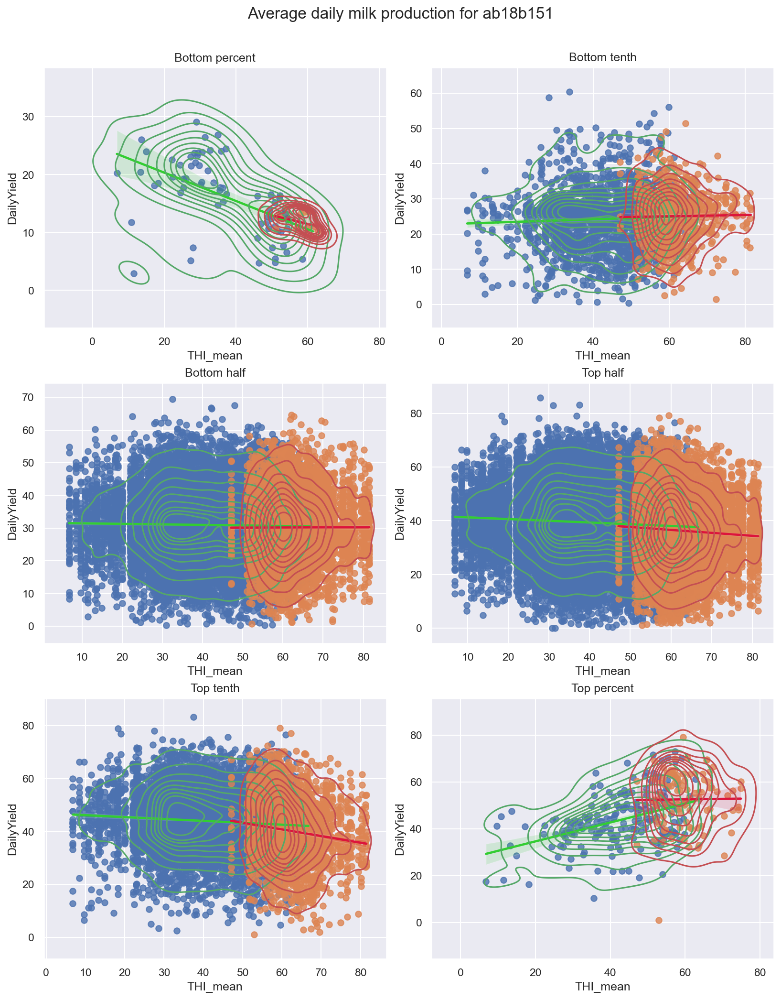


 752efd72 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: -0.126 		 Kendall: -0.023 		 Spearman: -0.038

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: 0.021 		 Kendall: -0.039 		 Spearman: -0.05

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.11 		 Kendall: 0.052 		 Spearman: 0.078

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: -0.038 		 Kendall: -0.031 		 Spearman: -0.047

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: 0.035 		 Kendall: 0.014 		 Spearman: 0.022

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.083 		 Kendall: -0.06 		 Spearman: -0.09

The correlations between average daily yield and

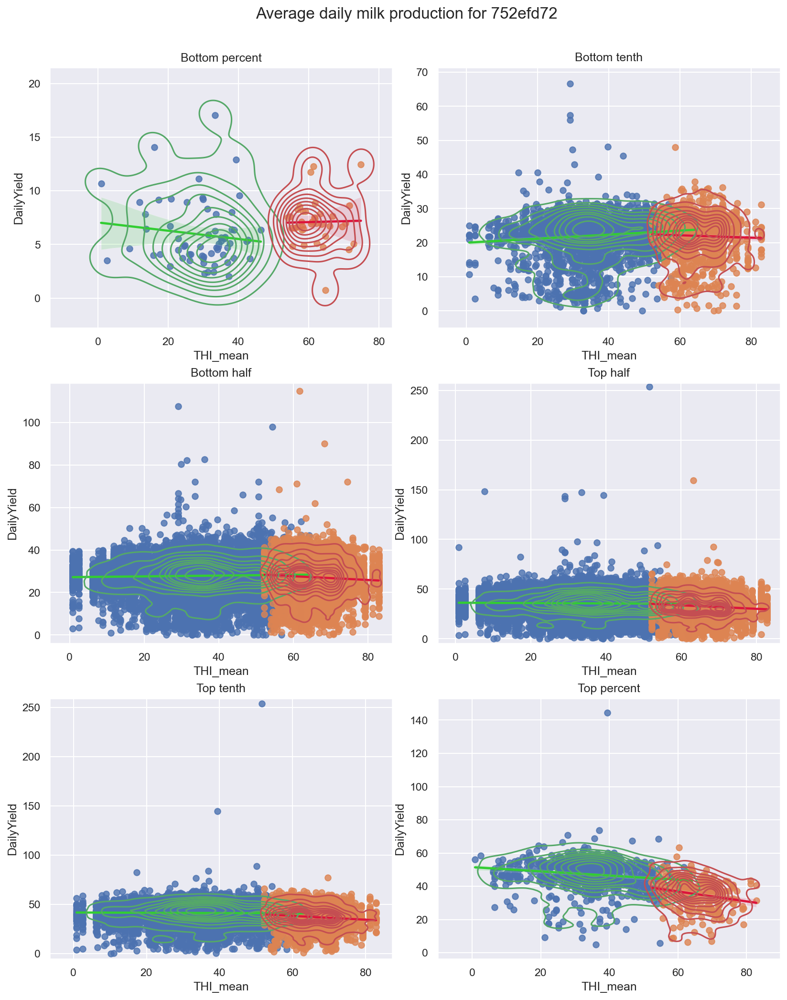


 5c06d92d 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: -0.037 		 Kendall: -0.037 		 Spearman: -0.056

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: -0.348 		 Kendall: -0.217 		 Spearman: -0.304

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: 0.074 		 Kendall: 0.043 		 Spearman: 0.064

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: 0.095 		 Kendall: 0.105 		 Spearman: 0.157

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: 0.063 		 Kendall: 0.041 		 Spearman: 0.061

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: -0.041 		 Kendall: -0.023 		 Spearman: -0.035

The correlations between average daily yield a

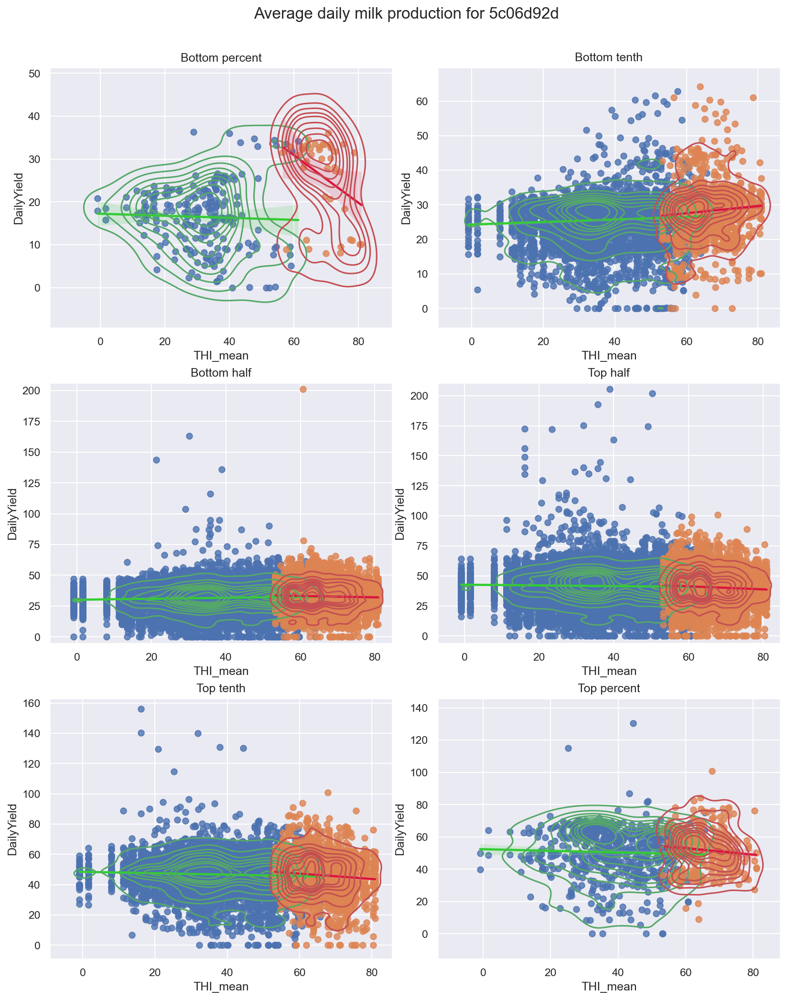


 ad0a39f5 

The correlations between average daily yield and THI_mean for the bottom percent of producers are:
Pearson: nan 		 Kendall: nan 		 Spearman: nan

The correlations between average daily yield and THI_mean for the bottom percent of producers in summer are:
Pearson: -0.436 		 Kendall: -0.239 		 Spearman: -0.361

The correlations between average daily yield and THI_mean for the bottom tenth of producers are:
Pearson: -0.15 		 Kendall: -0.153 		 Spearman: -0.233

The correlations between average daily yield and THI_mean for the bottom tenth of producers in summer are:
Pearson: 0.013 		 Kendall: 0.038 		 Spearman: 0.057

The correlations between average daily yield and THI_mean for the bottom half of producers are:
Pearson: -0.099 		 Kendall: -0.078 		 Spearman: -0.117

The correlations between average daily yield and THI_mean for the bottom half of producers in summer are:
Pearson: 0.002 		 Kendall: 0.008 		 Spearman: 0.011

The correlations between average daily yield and THI_

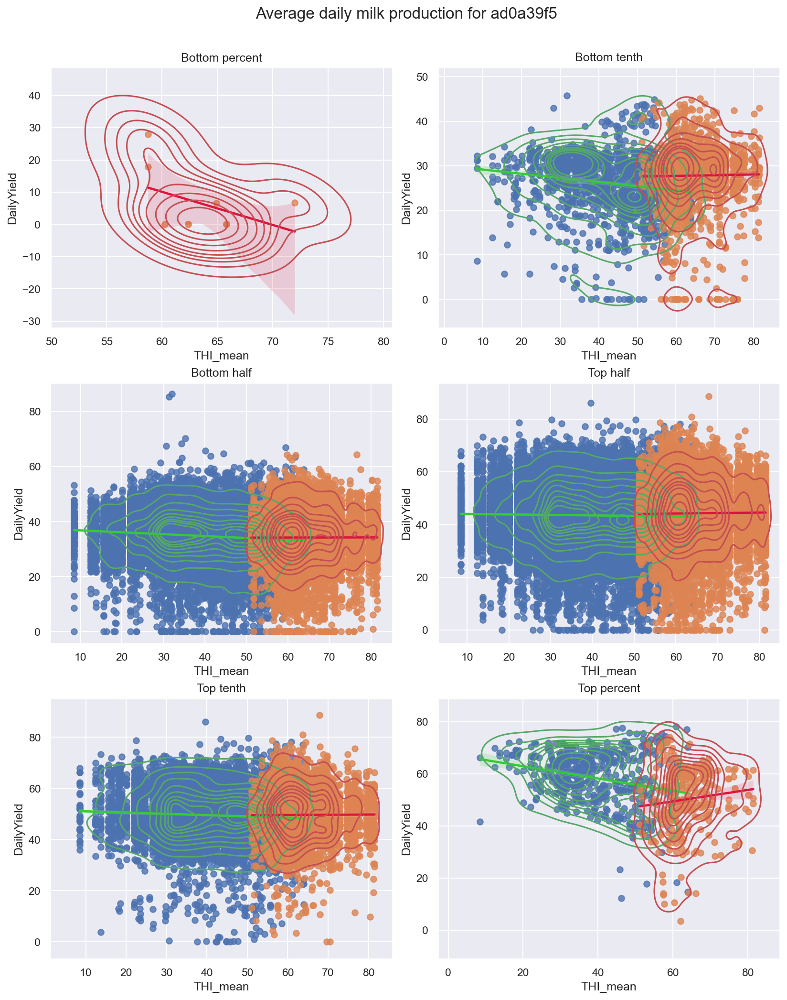

In [33]:
farms = ["a624fb9a","f454e660", "540275a1", "ab18b151", "752efd72", "5c06d92d", "ad0a39f5"]
for name in farms:
    farm = milk[milk["FarmName_Pseudo"] == name]
    print(f"\n {name} \n")
    summerSplitCorrs(farm, "THI_mean", 1, name)

In [34]:
def totalSummerSplitCorrs(milk, wVar, o):
    cownames = farmSlice["SE_Number"].unique()
    l = len(cownames)
    avProd = pd.DataFrame()
    for name in cownames:
        cow = farmSlice[farmSlice["SE_Number"] == name]
        avg = cow["DailyYield"].mean()
        avProd = pd.concat([avProd, pd.DataFrame.from_records([{"SE_Number": name, "AvgYield": avg}])])
    avProd = avProd.sort_values("AvgYield")

    bottomHalfNames = avProd.head(int(l/2))["SE_Number"]
    topHalfNames = avProd.tail(int(l/2))["SE_Number"]
    bottomTenthNames = avProd.head(int(l/10))["SE_Number"]
    topTenthNames = avProd.tail(int(l/10))["SE_Number"]
    bottomPercentNames = avProd.head(int(l/100))["SE_Number"]
    topPercentNames = avProd.tail(int(l/100))["SE_Number"]

    bottomHalf = farmSlice[farmSlice["SE_Number"].isin(bottomHalfNames)]
    topHalf = farmSlice[farmSlice["SE_Number"].isin(topHalfNames)]
    bottomTenth = farmSlice[farmSlice["SE_Number"].isin(bottomTenthNames)]
    topTenth = farmSlice[farmSlice["SE_Number"].isin(topTenthNames)]
    bottomPercent = farmSlice[farmSlice["SE_Number"].isin(bottomPercentNames)]
    topPercent = farmSlice[farmSlice["SE_Number"].isin(topPercentNames)]

    summerBottomPercent = bottomPercent[bottomPercent.index.month.isin([6,7,8])]
    winterBottomPercent = bottomPercent[bottomPercent.index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerBottomTenth = bottomTenth [bottomTenth .index.month.isin([6,7,8])]
    winterBottomTenth  = bottomTenth [bottomTenth .index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerBottomHalf = bottomHalf[bottomHalf.index.month.isin([6,7,8])]
    winterBottomHalf = bottomHalf[bottomHalf.index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerTopHalf = topHalf[topHalf.index.month.isin([6,7,8])]
    winterTopHalf = topHalf[topHalf.index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerTopTenth = topTenth[topTenth.index.month.isin([6,7,8])]
    winterTopTenth = topTenth[topTenth.index.month.isin([1,2,3,4,5,9,10,11,12])]

    summerTopPercent = topPercent[topPercent.index.month.isin([6,7,8])]
    winterTopPercent = topPercent[topPercent.index.month.isin([1,2,3,4,5,9,10,11,12])]

    corrPrint(winterBottomPercent, wVar, "bottom percent of producers")
    corrPrint(summerBottomPercent, wVar, "bottom percent of producers in summer")

    corrPrint(winterBottomTenth, wVar, "bottom tenth of producers")
    corrPrint(summerBottomTenth, wVar, "bottom tenth of producers in summer")

    corrPrint(winterBottomHalf, wVar, "bottom half of producers")
    corrPrint(summerBottomHalf, wVar, "bottom half of producers in summer")

    corrPrint(winterTopHalf, wVar, "top half of producers")
    corrPrint(summerTopHalf, wVar, "top half of producers in summer")

    corrPrint(winterTopTenth, wVar, "top tenth of producers")
    corrPrint(summerTopTenth, wVar, "top tenth of producers in summer")

    corrPrint(winterTopPercent, wVar, "top percent of producers")
    corrPrint(summerTopPercent, wVar, "top percent of producers in summer")

    sns.set()
    fig, axs = plt.subplots(3, 2, figsize = (11,14))
    fig.tight_layout(h_pad  = 3)
    axs = axs.ravel()
    sns.regplot(x = winterBottomPercent[wVar], y = winterBottomPercent["DailyYield"], ax=axs[0], line_kws={"color": "limegreen"}, order = o).set(title='Bottom percent')
    sns.regplot(x = summerBottomPercent[wVar], y = summerBottomPercent["DailyYield"], ax=axs[0], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterBottomPercent[wVar], y = winterBottomPercent["DailyYield"], ax=axs[0])
    sns.kdeplot(x = summerBottomPercent[wVar], y = summerBottomPercent["DailyYield"], ax=axs[0])

    sns.regplot(x = winterBottomTenth[wVar], y = winterBottomTenth["DailyYield"], ax=axs[1], line_kws={"color": "limegreen"}, order = o).set(title='Bottom tenth')
    sns.regplot(x = summerBottomTenth[wVar], y = summerBottomTenth["DailyYield"], ax=axs[1], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterBottomTenth[wVar], y = winterBottomTenth["DailyYield"], ax=axs[1])
    sns.kdeplot(x = summerBottomTenth[wVar], y = summerBottomTenth["DailyYield"], ax=axs[1])

    sns.regplot(x = winterBottomHalf[wVar], y = winterBottomHalf["DailyYield"], ax=axs[2], line_kws={"color": "limegreen"}, order = o).set(title='Bottom half')
    sns.regplot(x = summerBottomHalf[wVar], y = summerBottomHalf["DailyYield"], ax=axs[2], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterBottomHalf[wVar], y = winterBottomHalf["DailyYield"], ax=axs[2])
    sns.kdeplot(x = summerBottomHalf[wVar], y = summerBottomHalf["DailyYield"], ax=axs[2])

    sns.regplot(x = winterTopHalf[wVar], y = winterTopHalf["DailyYield"], ax=axs[3], line_kws={"color": "limegreen"}, order = o).set(title='Top half')
    sns.regplot(x = summerTopHalf[wVar], y = summerTopHalf["DailyYield"], ax=axs[3], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterTopHalf[wVar], y = winterTopHalf["DailyYield"], ax=axs[3])
    sns.kdeplot(x = summerTopHalf[wVar], y = summerTopHalf["DailyYield"], ax=axs[3])

    sns.regplot(x = winterTopTenth[wVar], y = winterTopTenth["DailyYield"], ax=axs[4], line_kws={"color": "limegreen"}, order = o).set(title='Top tenth')
    sns.regplot(x = summerTopTenth[wVar], y = summerTopTenth["DailyYield"], ax=axs[4], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterTopTenth[wVar], y = winterTopTenth["DailyYield"], ax=axs[4])
    sns.kdeplot(x = summerTopTenth[wVar], y = summerTopTenth["DailyYield"], ax=axs[4])

    sns.regplot(x = winterTopPercent[wVar], y = winterTopPercent["DailyYield"], ax=axs[5], line_kws={"color": "limegreen"}, order = o).set(title='Top percent')
    sns.regplot(x = summerTopPercent[wVar], y = summerTopPercent["DailyYield"], ax=axs[5], line_kws={"color": "crimson"}, order = o)
    sns.kdeplot(x = winterTopPercent[wVar], y = winterTopPercent["DailyYield"], ax=axs[5])
    sns.kdeplot(x = summerTopPercent[wVar], y = summerTopPercent["DailyYield"], ax=axs[5])

    fig.suptitle(f'Average daily milk production for {fname}', fontsize=16)
    plt.subplots_adjust(top=0.92)

    plt.show()

In [ ]:
milk = pd.read_csv("AllMilkingsDaily_Weather.csv")
milk["Timestamp"] = pd.to_datetime(milk["Timestamp"])
milk = milk.set_index("Timestamp")

totalSummerSplitCorrs(milk, "T_C_mean")